<a href="https://colab.research.google.com/github/InquietoPartho/Machine-Learning-Deep-Learning/blob/main/Plant_Disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d abdallahalidev/plantvillage-dataset

100% 2.04G/2.04G [01:31<00:00, 24.8MB/s]
100% 2.04G/2.04G [01:31<00:00, 23.8MB/s]


In [ ]:
from zipfile import ZipFile

dataset = '/content/plantvillage-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [ ]:
import random
random.seed(0)

import numpy as np
np.random.seed(0)

import tensorflow as tf
tf.random.set_seed(0)


Importing the dependencies

In [22]:
import os

from PIL import Image
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
data_dir = '/content/plantvillage dataset/color'

class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [ ]:
df.head()

,image_path,label
0,"/content/plantvillage dataset/color/Pepper,_be...","Pepper,_bell___healthy"
1,"/content/plantvillage dataset/color/Pepper,_be...","Pepper,_bell___healthy"
2,"/content/plantvillage dataset/color/Pepper,_be...","Pepper,_bell___healthy"
3,"/content/plantvillage dataset/color/Pepper,_be...","Pepper,_bell___healthy"
4,"/content/plantvillage dataset/color/Pepper,_be...","Pepper,_bell___healthy"


In [ ]:
df.shape

(54305, 2)

In [ ]:
print("The classes:\n", np.unique(df['label']))

The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'


In [ ]:
class_counts = df['label'].value_counts()
print(class_counts)

Orange___Haunglongbing_(Citrus_greening)              5507
Tomato___Tomato_Yellow_Leaf_Curl_Virus                5357
Soybean___healthy                                     5090
Peach___Bacterial_spot                                2297
Tomato___Bacterial_spot                               2127
Tomato___Late_blight                                  1909
Squash___Powdery_mildew                               1835
Tomato___Septoria_leaf_spot                           1771
Tomato___Spider_mites Two-spotted_spider_mite         1676
Apple___healthy                                       1645
Tomato___healthy                                      1591
Blueberry___healthy                                   1502
Pepper,_bell___healthy                                1478
Tomato___Target_Spot                                  1404
Grape___Esca_(Black_Measles)                          1383
Corn_(maize)___Common_rust_                           1192
Grape___Black_rot                                     11

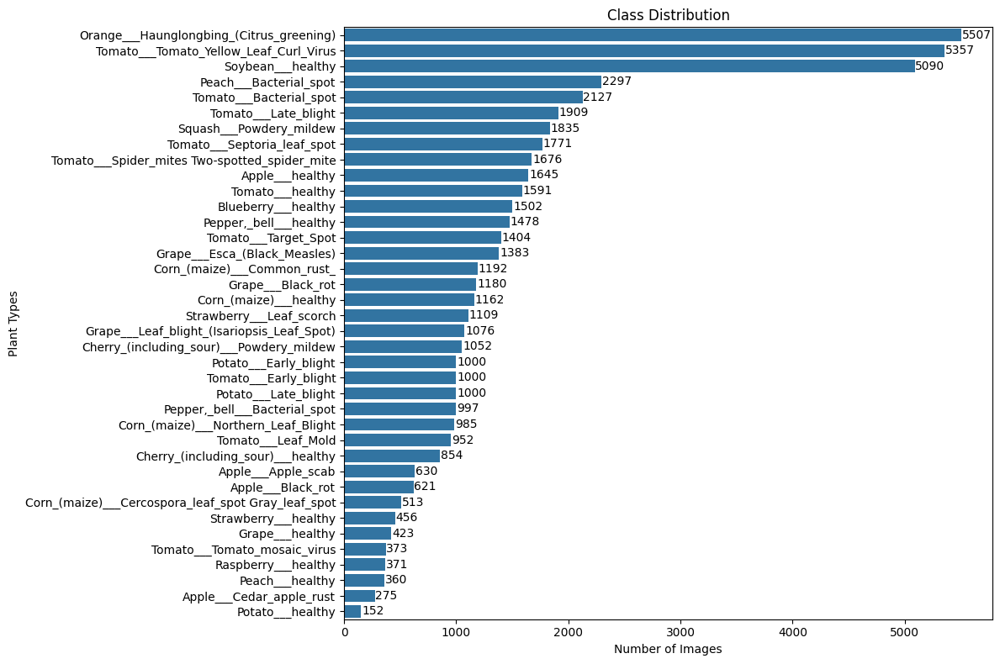

In [ ]:
class_counts = df['label'].value_counts()

# Visualize class distribution using a horizontal bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  # Adjust the layout to prevent overlapping labels

# Add data labels to each bar
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

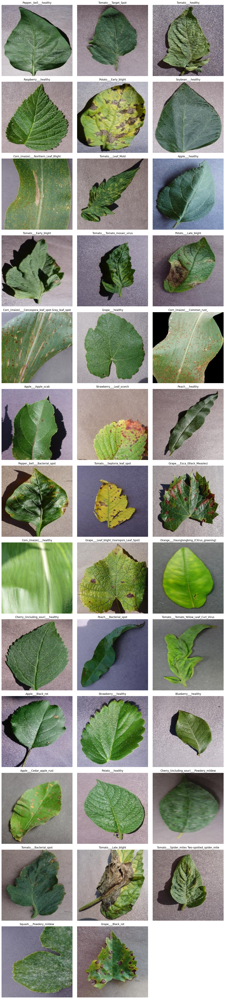

In [20]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  # Adjust figure size based on the number of rows

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)

    # Inside the loop for displaying sample images
    image_path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])

    # Check if the image exists and can be loaded
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")

plt.tight_layout()
plt.show()

Information about all images:
0         ((256, 256, 3), 0.01651477813720703, RGB)
1         ((256, 256, 3), 0.01802825927734375, RGB)
2         ((256, 256, 3), 0.01760578155517578, RGB)
3        ((256, 256, 3), 0.015040397644042969, RGB)
4        ((256, 256, 3), 0.010703086853027344, RGB)
                            ...                    
54300    ((256, 256, 3), 0.013989448547363281, RGB)
54301    ((256, 256, 3), 0.017630577087402344, RGB)
54302     ((256, 256, 3), 0.01954174041748047, RGB)
54303    ((256, 256, 3), 0.012775421142578125, RGB)
54304    ((256, 256, 3), 0.014870643615722656, RGB)
Name: info, Length: 54305, dtype: object


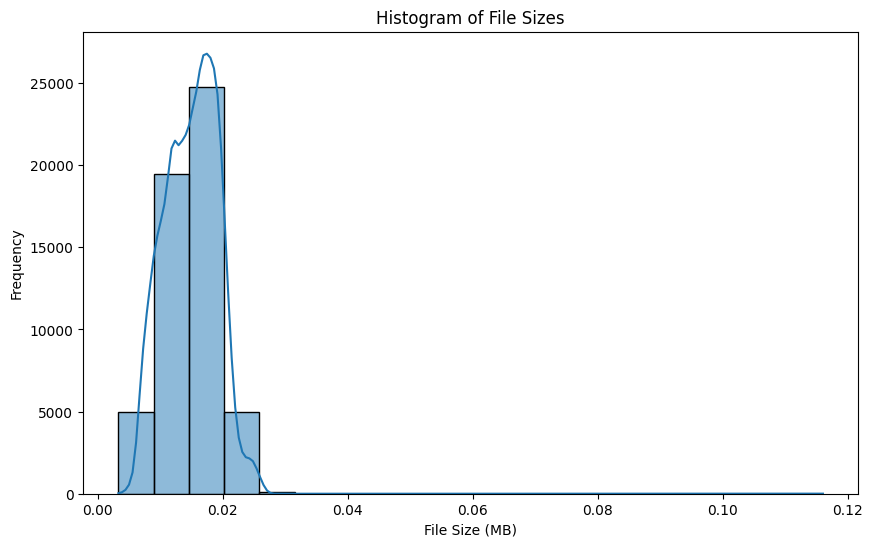

In [25]:
def get_image_info(image_path):
    img = cv2.imread(image_path)
    dimensions = img.shape
    file_size = os.path.getsize(image_path) / (1024 * 1024)  # Convert bytes to megabytes
    color_channels = 'Grayscale' if len(dimensions) == 2 else 'RGB'
    return dimensions, file_size, color_channels

# Get information for all images
df['info'] = df['image_path'].apply(get_image_info)

# Display information about all images
print("Information about all images:")
print(df['info'])

# Visualize a histogram of file sizes
plt.figure(figsize=(10, 6))
sns.histplot(df['info'].apply(lambda x: x[1]), bins=20, kde=True)
plt.title('Histogram of File Sizes')
plt.xlabel('File Size (MB)')
plt.ylabel('Frequency')
plt.show()

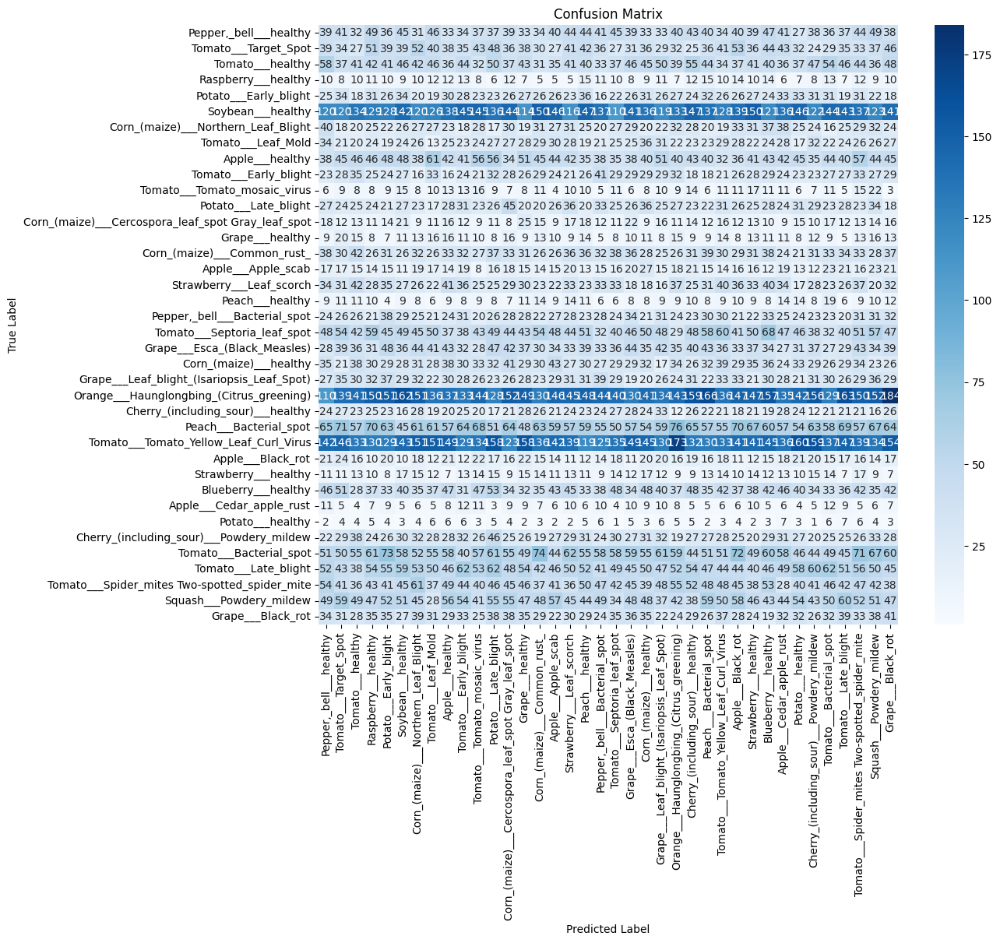

In [27]:
np.random.seed(0)  # for reproducibility
random_predictions = np.random.choice(df['label'].unique(), size=len(df))

# Compute confusion matrix
cm = confusion_matrix(df['label'], random_predictions, labels=df['label'].unique())

# Plot confusion matrix as heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=df['label'].unique(), yticklabels=df['label'].unique())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()